## Code

In [28]:
# Imports that will be used during code execution

#%%capture

import sympy as sp
import numpy as np
import torch
import matplotlib.pyplot as plt
from simulai.optimization import Optimizer
from simulai.residuals import SymbolicOperator

# Imports to neural network
from simulai.models import ImprovedDenseNetwork
from simulai.regression import SLFNN, ConvexDenseNetwork, DenseNetwork
from simulai.tokens import D
from simulai.file import SPFile


# Imports for visualization and animation
from matplotlib import animation, rc
from IPython.display import HTML

# Setting seed to aid reproducibility
np.random.seed(1234)

### Analytical Solution

For the configuration shown, we can use the following analytical solution [3] below considering that $ξ= x/t$:



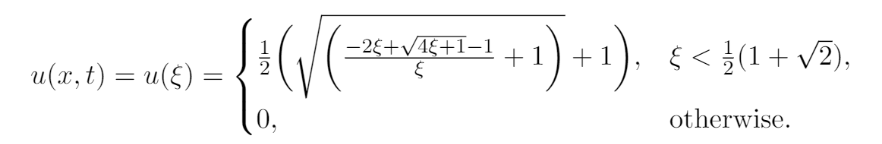

At the end of the execution of the code below we will have a $u\_n$ matrix of dimensions $(nt,nx)$, composed of $nt$ measurements in time and $nx$ measurements in space that make up the chosen _grid_.

In [29]:
# Solution parameters and dataset building

nx = 401  # Number of points to be plotted
dx = 1./(nx-1) # Distance between each plotted point
nt = 301  # Number of points in which the time will be divided (snapshots)
dt = 1./(nt-1)  # Time between snapshots


def u_analytic(x,t):
  u_value = 0
  if t == 0:
    u_value = 0
  elif x == 0 and t > 0:
    u_value = 1
  elif x < (1/2)*(1+np.sqrt(2))*t:
    e = x/t
    u_value = (1/2)*(np.sqrt((-2*e+np.sqrt(4*e+1)-1)/e +1)+1)

  return u_value

u_n = np.zeros((nt,nx)) # Matrix of nt rows and nx columns
for i in range(nt):
    for j in range(nx):
          u_n[i,j] = u_analytic(j*dx, i*dt)

### PINN - Convex-Hull

For nonconvex scalar conservation laws, it is possible to write (Oleinik entropy condition):
$\space$

 <h2> $ \frac{f(u) - f(u_l)}{u-u_l} ≥ σ \ge \frac{f(u) - f(u_r)}{u-u_r} $ </h2>
$\space$
where $u_{l,r}$ are saturation values just before and after the discontinuity and $𝜎$ is the shock speed defined as:
$\space$

$σ = f'(u^*)=\frac{f(u^*)}{u^*}$

$\space$

So, we are looking for a spefic $u$ (called $u^*$) that solves:

$f_w'(u^*) - \frac{f_w(u^*)}{u^*} =0$

$\space$

The solution is:

$u^* = \sqrt{\frac{1}{(1+M)}} $ (check the appendix)

$\space$

In the PDE we will change $f_w$ for $\tilde{f}_w$, written as:


$\tilde{f}_w(u) = \left\{
\begin{array}{ll}
σ u &&&& 0\leq u < u^* \\
f_w(u) &&&& u \ge u^*
\end{array}
\right.$

$\space$

And we will solve the new PDE:

$u_t+(\tilde{f}_w)_x=0$

In [30]:
# Parameter Setting

N = 10_000
n = 100
T_max = 1
x_max = 1

g_1 = 'u-1' # Boundary condition

# Constant
M = 1

#############################
# Dealing with hyperbolicity
#############################
def f_w(u):
    return  (u**2)/(u**2+((1-u)**2)/M)


u_star = np.sqrt(1/(1+M))
sigma = f_w(u_star)/u_star

def f_w_tilde(u):
    return torch.where(u < u_star,
                       sigma*u,
                       f_w(u)
                      )
############################


In [31]:
# Network Parameter Settings

input_labels = ["x", "t"]
output_labels = ["u"]
n_inputs = len(input_labels)
n_outputs = len(output_labels)
n_epochs = 10000
lr = 1e-3

boundary_penalties = [1]
weights_residual =  [1]
initial_penalty = 1

# PDE training and test set definition
x_eval = (np.random.rand(N) * x_max)[:, None]
time_eval = (np.random.rand(N) * T_max)[:, None]

# Regular grid
X_DIM = 100
T_DIM = 100

dx = (x_max) / X_DIM
dt_ = (T_max) / T_DIM

grid = np.mgrid[dt_ : T_max + dt_ : dt_, 0:x_max:dx]

X_train = np.hstack([grid[1].flatten()[:, None], grid[0].flatten()[:, None]])

In [32]:
# Dataset Definition for Initial Condition
# u=0 at t=0 for any x

x_init = np.linspace(0, x_max, 3*n)[:, None]
t_init = np.zeros(3*n)[:, None]

data_initial = np.hstack([x_init, t_init])

u_initial = np.zeros(3*n)[:, None]

# Data definition for boundary condition
# For t>0, u=1 for x=0.

x_bc = np.zeros(3*n)[:, None]
t_bc = np.linspace(1e-8, T_max, 3*n)[:, None]

data_bc = np.hstack([x_bc, t_bc])

In [33]:
# Setting the function that will build the training net
# It is possible to choose two different types of networks

def model(net_type="Improved"):

  # If it is a fully connected network

  if net_type=="Dense":

    # Configuration for the fully-connected network
    config = {
        "layers_units": 6*[128],
        "activations": "tanh",
        "input_size": 2,
        "output_size": 1,
        "name": "net",
    }

    # Instantiating and training the surrogate model
    net = DenseNetwork(**config)

    return net

  # If you want to use the ImprovedDenseNetwork
  elif(net_type=="Improved"):

    # Configuration for the ImprovedDenseNetwork
    config = {
        "layers_units": 6*[128],
        "activations": "elu",
        "input_size": 2,
        "output_size": 1,
        "name": "net",
    }

    # Instantiating and training the surrogate model
    densenet = ConvexDenseNetwork(**config)
    encoder_u = SLFNN(input_size=n_inputs, output_size=128, activation="tanh")
    encoder_v = SLFNN(input_size=n_inputs, output_size=128, activation="tanh")

    net = ImprovedDenseNetwork(
        network=densenet,
        encoder_u=encoder_u,
        encoder_v=encoder_v,
        devices="gpu",
    )

    return net

In [34]:
# PDE

f = "D(u, t) + D(f_w_tilde(u), x)"

# Network
net = model("Improved")

# Residual

residual = SymbolicOperator(
    expressions=[f],
    input_vars=["x","t"],
    output_vars=["u"],
    auxiliary_expressions={'x_bc': g_1},
    external_functions={'f_w_tilde': f_w_tilde},
    constants = {'M': M},
    function=net,
    engine="torch",
    device="gpu",
)


params = {
    "residual": residual,
    "initial_input": data_initial,
    "initial_state": u_initial,
    'boundary_input': {'x_bc': data_bc},
    'boundary_penalties': boundary_penalties,
    "weights_residual": weights_residual,
    "initial_penalty": initial_penalty,
}


optimizer_config = {"lr": lr}
optimizer = Optimizer("adam", params=optimizer_config,
                      lr_decay_scheduler_params={'name': 'ExponentialLR',
                                                 'gamma': 0.8,
                                                 'decay_frequency': 2_500,
                                                 'verbose': True},
                     shuffle=False)


Optimizer adam found in torch.optim.


In [ ]:
optimizer.fit(
    op=net,
    input_data= X_train,
    n_epochs=n_epochs,
    loss="pirmse",
    params=params,
    device="gpu",
)

# Saving model for future use if necessary
saver = SPFile(compact=False)
saver.write(save_dir='./', name="buckley_leverett_hyperbolic", model=net, template=model)


### Analysis and Charts

In [ ]:
# If the next cell gives an error like "RuntimeError: Expected all tensors
# to be on the same device, but found at least two devices, cuda:0 and cpu!
# (when checking # argument for argument mat1 in method wrapper_CUDA_addmm)"
# to the "eval" then adapt and use the code below passing everything to CPU
# or GPU depending on the colab resource

#net.to("cuda")


net.to("cpu")

DenseNetwork(
  (net_input): Linear(in_features=2, out_features=128, bias=True)
  (net_0): Linear(in_features=128, out_features=128, bias=True)
  (net_1): Linear(in_features=128, out_features=128, bias=True)
  (net_2): Linear(in_features=128, out_features=128, bias=True)
  (net_3): Linear(in_features=128, out_features=128, bias=True)
  (net_4): Linear(in_features=128, out_features=128, bias=True)
  (net_5): Linear(in_features=128, out_features=1, bias=True)
)

In [ ]:
# This cell creates an array with PINN solutions in the same grid
# used for the analytical solution

u_n_pinn = np.zeros((nt,nx)) # Matrix of nt rows and nx columns

for n in range(0,nt):
  x_plot = np.linspace(0, x_max, nx)[:, None]
  t_plot = ((n * dt)*np.ones(nx))[:, None]
  data_plot = np.hstack([x_plot, t_plot])
  u_approximated_plot = net.eval(input_data=np.hstack([x_plot, t_plot]))
  u_n_pinn[n] = u_approximated_plot.flatten()

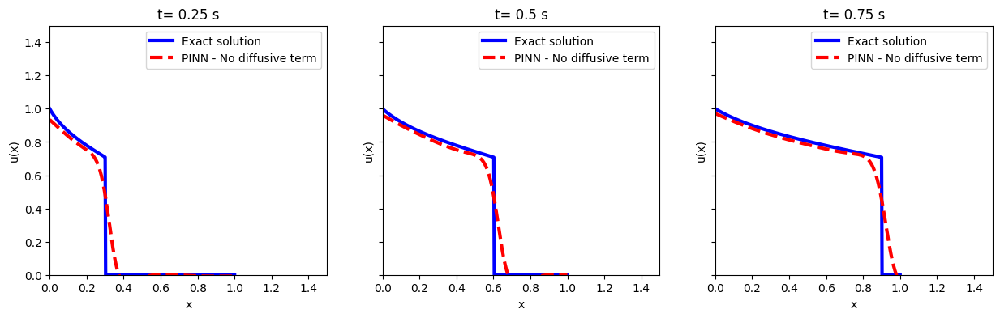

In [ ]:
# Plots the chart of PINN with and without diffusion term together with the
# analytical solution


fig, axs = plt.subplots(1, 3, sharey=True,  figsize=(15, 4))

t_especific = [0.25, 0.5,0.75]

index = int(t_especific[0]/dt)
axs[0].plot(np.linspace(0,1,nx), u_n[index],color='blue' , ls='-', lw=3, label="Exact solution")
axs[0].plot(x_plot,  u_n_pinn[index], color='red', ls='--', lw=3,  label="PINN - No diffusive term")

axs[0].set_title("t= " + str(t_especific[0]) + " s")
axs[0].set_ylim(0,1.5)
axs[0].set_xlim(0,1.5)
axs[0].legend()


index = int(t_especific[1]/dt)
axs[1].set_title("t= " + str(t_especific[1]) + " s")
axs[1].plot(np.linspace(0,1,nx), u_n[index],color='blue' , ls='-', lw=3, label="Exact solution")
axs[1].plot(x_plot,  u_n_pinn[index], color='red', ls='--', lw=3,  label="PINN - No diffusive term")


axs[1].legend()
axs[1].set_ylim(0,1.5)
axs[1].set_xlim(0,1.5)

index = int(t_especific[2]/dt)
axs[2].set_title("t= " + str(t_especific[2]) + " s")
axs[2].plot(np.linspace(0,1,nx), u_n[index],color='blue' , ls='-', lw=3, label="Exact solution")
axs[2].plot(x_plot,  u_n_pinn[index], color='red', ls='--', lw=3,  label="PINN - No diffusive term")


axs[2].legend()
axs[2].set_ylim(0,1.5)
axs[2].set_xlim(0,1.5)

for ax in axs.flat:
    ax.set(xlabel='x', ylabel='u(x)')

plt.savefig("snapshot.png")
plt.show()

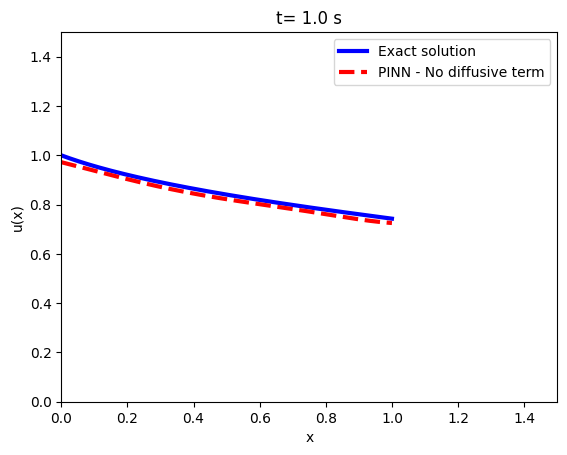

In [ ]:
fig = plt.figure()
ax = plt.axes(xlim=(0.0,1.5),ylim=(0.0,1.5),xlabel=('x'),ylabel=('u(x)'))
line = ax.plot([], [], color='blue', ls='-', lw=3, label="Exact solution")[0]
line2 = ax.plot([], [], color='red', ls='--', lw=3, label="PINN - No diffusive term")[0]


def init():
    line.set_data([], [])
    line2.set_data([], [])
    return line, line2

def animate(i):
    x = np.linspace(0.0,1,nx)
    y = u_n[i,:].copy()
    y2 = u_n_pinn[i,:].copy()
    line.set_data(x,y)
    line2.set_data(x,y2)
    plt.title("t= " + str(round(i*dt,2)) + " s")
    plt.legend()
    return line,line2

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=nt, interval=100, blit=True)

rc('animation', html='jshtml')


# Save animation as a gif file
anim.save("result.gif", writer="pillow")

anim

In [ ]:
# Analysis on the test set

#Exact solution
u_exact = np.zeros(N)
i=0
for x,t in zip(x_eval, time_eval):
    u_exact[i]= u_analytic(x,t)
    i=i+1

# PINN Solution

u_approximated_eval = net.eval(input_data=np.hstack([x_eval, time_eval]))

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6516\3043245530.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u_exact[i]= u_analytic(x,t)


In [ ]:
import numpy as np

# Assume u_approximated_eval and u_exact are defined

# Root Mean Square Error (RMSE)
error_pinn_rmse = np.sqrt(np.mean((u_approximated_eval.flatten() - u_exact)**2))

# Mean Absolute Error (MAE)
error_pinn_mae = np.mean(np.abs(u_approximated_eval.flatten() - u_exact))

# Mean Squared Error (MSE)
error_pinn_mse = np.mean((u_approximated_eval.flatten() - u_exact)**2)

print("The RMSE of the PINN without diffusive term was:", error_pinn_rmse)
print("The MAE of the PINN without diffusive term was:", error_pinn_mae)
print("The MSE of the PINN without diffusive term was:", error_pinn_mse)


The RMSE of the PINN without diffusive term was: 0.06854786323184836
The MAE of the PINN without diffusive term was: 0.03460444987094535
The MSE of the PINN without diffusive term was: 0.004698809553652189


In [ ]:
# Bias
bias_pinn = np.mean(u_approximated_eval.flatten() - u_exact)

print("The bias of the PINN without diffusive term was:", bias_pinn)
# Assume bias_pinn and u_exact are defined

# Percent Bias
percent_bias = (bias_pinn / u_exact) * 100

print("The percent bias of the PINN without diffusive term was:", np.mean(percent_bias), "%")



The bias of the PINN without diffusive term was: -0.011859675422073739
The percent bias of the PINN without diffusive term was: -inf %


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6516\869046041.py:8: RuntimeWarning: divide by zero encountered in divide
  percent_bias = (bias_pinn / u_exact) * 100


## Appendix

### Finding $u^*$:

In [ ]:
u, M = sp.symbols('u M')
f = u**2/(u**2 + (1-u)**2/M)

In [ ]:
sp.solve(f.diff(u) - f/u, u)

[0, -sqrt(1/(M + 1)), sqrt(1/(M + 1))]

The only viable and acceptable solution:
$ u^* = \frac{1}{\sqrt{1+M}} $